<a href="https://colab.research.google.com/github/longxuyi/Stanford/blob/main/CME216/hw6_wandb_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive/')


Mounted at /content/drive/


In [3]:
import os
os.chdir('/content/drive/MyDrive/Winter 2023/CME216/hw6/CAE_project')

In [4]:
!pwd

/content/drive/MyDrive/Winter 2023/CME216/hw6/CAE_project


In [5]:
!pip install wandb -qU

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 22.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 KB 22.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 KB 20.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 8.7 MB/s eta 0:00:00


In [6]:
#modified based on models.py
# Importing the libraries
import torch
import torch.nn as nn
from torchsummary import summary

# ==============================================================================
# CAE (Convolutional Autoencoder)
# ==============================================================================
class CAE(nn.Module):
  def __init__(self, dim, h_dim):
    super(CAE, self).__init__()
    self.dim = dim
    self.h_dim = h_dim
    self.down_scale = nn.Sequential(
              nn.Conv2d(1, self.dim, 4, 2, 1),
              nn.LeakyReLU(0.25),
              nn.BatchNorm2d(self.dim),
              nn.Conv2d(self.dim, 2 * self.dim, 4, 2, 1),
              nn.LeakyReLU(0.25),
              nn.BatchNorm2d(2 * self.dim),
              nn.Conv2d(2 * self.dim, 4 * self.dim, 4, 2, 1),
              nn.LeakyReLU(0.25),
              nn.BatchNorm2d(4 * self.dim),
              nn.Conv2d(4 * self.dim, 8 * self.dim, 4, 2, 1),
              nn.LeakyReLU(0.25),
              nn.BatchNorm2d(8 * self.dim)
          )
    
    self.p = 8*self.dim*2*2
    self.q = self.p/4

    #define bottleneck layer
    self.bottleneck = nn.Sequential(

              #connect to a hidden/bottleneck layer of dimension h_dim
              torch.nn.Linear(self.p, self.h_dim),

              #leakyReLU
              nn.LeakyReLU(0.25),

              #1D batchnorm
              nn.BatchNorm1d(self.h_dim),

              #connect to a hidden/bottleneck layer of dimension h_dim
              torch.nn.Linear(self.h_dim, self.p),

              #leakyReLU
              nn.LeakyReLU(0.25),

              #1D batchnorm
              nn.BatchNorm1d(self.p)   
          )

    self.up_scale = nn.Sequential(
              nn.ConvTranspose2d(8 * self.dim, 4 * self.dim, 4, 2, 1),
              nn.LeakyReLU(0.25),
              nn.BatchNorm2d(4 * self.dim),
              nn.ConvTranspose2d(4 * self.dim, 2 * self.dim, 4, 2, 1),
              nn.LeakyReLU(0.25),
              nn.BatchNorm2d(2 * self.dim),
              nn.ConvTranspose2d(2 * self.dim, self.dim, 4, 2, 1),
              nn.LeakyReLU(0.25),
              nn.BatchNorm2d(self.dim),
              nn.ConvTranspose2d(self.dim, 1, 4, 2, 1),
              nn.LeakyReLU(0.25)
          )
  

  def forward(self, x):
    x = self.down_scale(x)
    #reshape output to 2d tensor of shape [batch_size, p]
    x = x.reshape([-1,self.p])

    #bottleneck layer
    x = self.bottleneck(x)
    
    #reshape to a 4D tensor with shape [batch_size, q,2,2]
    x = x.reshape([-1,8*self.dim, 2,2])
    
    output = self.up_scale(x)
    return output

#summary(model, (1, 32, 32))

In [7]:
#COPY FROM utils.py
# Import libraries
import numpy as np
import wandb
import matplotlib.pyplot as plt
import plotly.express as px
from mpl_toolkits.axes_grid1 import make_axes_locatable


def l2_pt_error(pred, true):
    return (np.linalg.norm(pred - true) / np.linalg.norm(true))*100


def plot_perm_and_temp(m_field, u_field, model_pred, epoch):
    """Plot the pressure (u_field) and the permeability (m_field)
    """
    cmap = "inferno"
    fig, axs = plt.subplots(4, 5, figsize=(15, 12))
    for i in range(5):
        im = axs[0, i].imshow(m_field[i, :, :], cmap=cmap)
        divider = make_axes_locatable(axs[0, i])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        fig.colorbar(im, ax=axs[0, i], cax=cax)
        axs[0, i].set_title(f"Perm. {i}")
        axs[0, i].set_xticks([])
        axs[0, i].set_yticks([])

        axs[1, i].imshow(u_field[i, :, :], cmap=cmap)
        divider = make_axes_locatable(axs[1, i])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        fig.colorbar(im, ax=axs[1, i], cax=cax)
        axs[1, i].set_title(f"True pressure. {i}")
        axs[1, i].set_xticks([])
        axs[1, i].set_yticks([])

        axs[2, i].imshow(model_pred[i, :, :].squeeze(), cmap=cmap)
        divider = make_axes_locatable(axs[2, i])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        fig.colorbar(im, ax=axs[2, i], cax=cax)
        axs[2, i].set_title(f"Pred. pressure. {i}")
        axs[2, i].set_xticks([])
        axs[2, i].set_yticks([])

        diff = model_pred - u_field
        axs[3, i].imshow(diff[i, :, :], cmap=cmap)
        divider = make_axes_locatable(axs[3, i])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        fig.colorbar(im, ax=axs[3, i], cax=cax)
        axs[3, i].set_title(f"Error = {l2_pt_error(model_pred[i, :, :], u_field[i, :, :]):.2f}%")
        axs[3, i].set_xticks([])
        axs[3, i].set_yticks([])

    plt.tight_layout()
    wandb.log({"true_pred_pressure": fig, "epoch": epoch})

#plot histogram
def hist(relative_error, epoch):
    # fig, ax = plt.subplots(1, 1, figsize=(6, 4))
    # ax.hist(relative_error)
    # plt.xlabel("relative error %")
    # plt.ylabel("frequency")
    # #plt.show()
    # plt.tight_layout()

    fig = px.histogram(relative_error, range_x = [0,100])
    fig.update_layout(
        xaxis_title = "relative error"
        yaxis_title = "frequency"
    )

    wandb.log({"histogram": fig, "epoch": epoch})

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


cuda
{'method': 'grid',
 'metric': {'goal': 'minimize', 'name': 'val_loss'},
 'name': 'grid_search',
 'parameters': {'dim': {'values': [16, 32, 64]},
                'h_dim': {'values': [64, 128, 256]},
                'lr': {'values': [0.001]},
                'reg_param': {'values': [0.0]}}}
Create sweep with ID: la3kmcz6
Sweep URL: https://wandb.ai/cme216_longxuyi/cme216_hw6/sweeps/la3kmcz6


wandb: Agent Starting Run: 24vhgv8m with config:
wandb: 	dim: 16
wandb: 	h_dim: 64
wandb: 	lr: 0.001
wandb: 	reg_param: 0
wandb: Currently logged in as: longxuyi (cme216_longxuyi). Use `wandb login --relogin` to force relogin
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


dim: 16 h_dim: 64 
Epoch [15/150], Step [4/4],                     Training Loss: 0.5046, Validation Loss: 0.4962,                     Val. error (in %) = 93.52%
Epoch [30/150], Step [4/4],                     Training Loss: 0.3648, Validation Loss: 0.3538,                     Val. error (in %) = 78.91%
Epoch [45/150], Step [4/4],                     Training Loss: 0.1179, Validation Loss: 0.1133,                     Val. error (in %) = 44.88%
Epoch [60/150], Step [4/4],                     Training Loss: 0.0174, Validation Loss: 0.0172,                     Val. error (in %) = 17.49%
Epoch [75/150], Step [4/4],                     Training Loss: 0.0067, Validation Loss: 0.0077,                     Val. error (in %) = 11.55%
Epoch [90/150], Step [4/4],                     Training Loss: 0.0039, Validation Loss: 0.0052,                     Val. error (in %) = 9.54%
Epoch [105/150], Step [4/4],                     Training Loss: 0.0035, Validation Loss: 0.0038,                     Val. er

epoch,▁▁▁▂▂▂▃▃▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇███
train_loss,█▆▃▁▁▁▁▁▁▁
val_loss,█▆▃▁▁▁▁▁▁▁
val_rel_error_pt,█▇▄▂▁▁▁▁▁▁
epoch,149
train_loss,0.00232
val_loss,0.00315
val_rel_error_pt,7.34829


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 50ia4mqp with config:
wandb: 	dim: 16
wandb: 	h_dim: 128
wandb: 	lr: 0.001
wandb: 	reg_param: 0
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


dim: 16 h_dim: 128 
Epoch [15/150], Step [4/4],                     Training Loss: 0.4478, Validation Loss: 0.4450,                     Val. error (in %) = 88.49%
Epoch [30/150], Step [4/4],                     Training Loss: 0.2694, Validation Loss: 0.2588,                     Val. error (in %) = 67.69%
Epoch [45/150], Step [4/4],                     Training Loss: 0.0740, Validation Loss: 0.0722,                     Val. error (in %) = 35.82%
Epoch [60/150], Step [4/4],                     Training Loss: 0.0102, Validation Loss: 0.0103,                     Val. error (in %) = 13.54%
Epoch [75/150], Step [4/4],                     Training Loss: 0.0045, Validation Loss: 0.0056,                     Val. error (in %) = 9.79%
Epoch [90/150], Step [4/4],                     Training Loss: 0.0033, Validation Loss: 0.0039,                     Val. error (in %) = 8.21%
Epoch [105/150], Step [4/4],                     Training Loss: 0.0030, Validation Loss: 0.0032,                     Val. er

epoch,▁▁▁▂▂▂▃▃▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇███
train_loss,█▅▂▁▁▁▁▁▁▁
val_loss,█▅▂▁▁▁▁▁▁▁
val_rel_error_pt,█▆▄▂▁▁▁▁▁▁
epoch,149
train_loss,0.00243
val_loss,0.00232
val_rel_error_pt,6.24007


wandb: Agent Starting Run: 5hii204c with config:
wandb: 	dim: 16
wandb: 	h_dim: 256
wandb: 	lr: 0.001
wandb: 	reg_param: 0
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


dim: 16 h_dim: 256 


<ipython-input-7-9fa58de00bad>:18: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



Epoch [15/150], Step [4/4],                     Training Loss: 0.5402, Validation Loss: 0.5397,                     Val. error (in %) = 97.57%
Epoch [30/150], Step [4/4],                     Training Loss: 0.4016, Validation Loss: 0.3959,                     Val. error (in %) = 83.58%
Epoch [45/150], Step [4/4],                     Training Loss: 0.1453, Validation Loss: 0.1399,                     Val. error (in %) = 49.88%
Epoch [60/150], Step [4/4],                     Training Loss: 0.0225, Validation Loss: 0.0183,                     Val. error (in %) = 17.95%
Epoch [75/150], Step [4/4],                     Training Loss: 0.0065, Validation Loss: 0.0062,                     Val. error (in %) = 10.45%
Epoch [90/150], Step [4/4],                     Training Loss: 0.0043, Validation Loss: 0.0057,                     Val. error (in %) = 9.94%
Epoch [105/150], Step [4/4],                     Training Loss: 0.0044, Validation Loss: 0.0037,                     Val. error (in %) = 8.05%


epoch,▁▁▁▂▂▂▃▃▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇███
train_loss,█▆▃▁▁▁▁▁▁▁
val_loss,█▆▃▁▁▁▁▁▁▁
val_rel_error_pt,█▇▄▂▁▁▁▁▁▁
epoch,149
train_loss,0.00216
val_loss,0.00241
val_rel_error_pt,6.46057


wandb: Agent Starting Run: zss4g4qx with config:
wandb: 	dim: 32
wandb: 	h_dim: 64
wandb: 	lr: 0.001
wandb: 	reg_param: 0
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


dim: 32 h_dim: 64 
Epoch [15/150], Step [4/4],                     Training Loss: 0.3737, Validation Loss: 0.3734,                     Val. error (in %) = 80.92%
Epoch [30/150], Step [4/4],                     Training Loss: 0.0804, Validation Loss: 0.0655,                     Val. error (in %) = 34.05%
Epoch [45/150], Step [4/4],                     Training Loss: 0.0080, Validation Loss: 0.0083,                     Val. error (in %) = 12.04%
Epoch [60/150], Step [4/4],                     Training Loss: 0.0050, Validation Loss: 0.0055,                     Val. error (in %) = 9.82%
Epoch [75/150], Step [4/4],                     Training Loss: 0.0034, Validation Loss: 0.0038,                     Val. error (in %) = 8.04%
Epoch [90/150], Step [4/4],                     Training Loss: 0.0032, Validation Loss: 0.0034,                     Val. error (in %) = 7.62%
Epoch [105/150], Step [4/4],                     Training Loss: 0.0025, Validation Loss: 0.0027,                     Val. erro

epoch,▁▁▁▂▂▂▃▃▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇███
train_loss,█▂▁▁▁▁▁▁▁▁
val_loss,█▂▁▁▁▁▁▁▁▁
val_rel_error_pt,█▄▂▁▁▁▁▁▁▁
epoch,149
train_loss,0.00215
val_loss,0.00251
val_rel_error_pt,6.57111


wandb: Agent Starting Run: nu7oguz8 with config:
wandb: 	dim: 32
wandb: 	h_dim: 128
wandb: 	lr: 0.001
wandb: 	reg_param: 0
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


dim: 32 h_dim: 128 
Epoch [15/150], Step [4/4],                     Training Loss: 0.4210, Validation Loss: 0.4116,                     Val. error (in %) = 85.00%
Epoch [30/150], Step [4/4],                     Training Loss: 0.1287, Validation Loss: 0.1117,                     Val. error (in %) = 44.52%
Epoch [45/150], Step [4/4],                     Training Loss: 0.0124, Validation Loss: 0.0128,                     Val. error (in %) = 14.95%
Epoch [60/150], Step [4/4],                     Training Loss: 0.0052, Validation Loss: 0.0053,                     Val. error (in %) = 9.57%
Epoch [75/150], Step [4/4],                     Training Loss: 0.0036, Validation Loss: 0.0040,                     Val. error (in %) = 8.23%
Epoch [90/150], Step [4/4],                     Training Loss: 0.0033, Validation Loss: 0.0036,                     Val. error (in %) = 7.86%
Epoch [105/150], Step [4/4],                     Training Loss: 0.0025, Validation Loss: 0.0030,                     Val. err

epoch,▁▁▁▂▂▂▃▃▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇███
train_loss,█▃▁▁▁▁▁▁▁▁
val_loss,█▃▁▁▁▁▁▁▁▁
val_rel_error_pt,█▄▂▁▁▁▁▁▁▁
epoch,149
train_loss,0.00198
val_loss,0.00197
val_rel_error_pt,5.76335


wandb: Agent Starting Run: r4a1avks with config:
wandb: 	dim: 32
wandb: 	h_dim: 256
wandb: 	lr: 0.001
wandb: 	reg_param: 0
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


dim: 32 h_dim: 256 
Epoch [15/150], Step [4/4],                     Training Loss: 0.3667, Validation Loss: 0.3716,                     Val. error (in %) = 80.71%
Epoch [30/150], Step [4/4],                     Training Loss: 0.1228, Validation Loss: 0.1078,                     Val. error (in %) = 43.55%
Epoch [45/150], Step [4/4],                     Training Loss: 0.0176, Validation Loss: 0.0148,                     Val. error (in %) = 16.18%
Epoch [60/150], Step [4/4],                     Training Loss: 0.0073, Validation Loss: 0.0064,                     Val. error (in %) = 10.58%
Epoch [75/150], Step [4/4],                     Training Loss: 0.0045, Validation Loss: 0.0054,                     Val. error (in %) = 9.65%
Epoch [90/150], Step [4/4],                     Training Loss: 0.0033, Validation Loss: 0.0035,                     Val. error (in %) = 7.75%
Epoch [105/150], Step [4/4],                     Training Loss: 0.0024, Validation Loss: 0.0033,                     Val. er

epoch,▁▁▁▂▂▂▃▃▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇███
train_loss,█▃▁▁▁▁▁▁▁▁
val_loss,█▃▁▁▁▁▁▁▁▁
val_rel_error_pt,█▄▂▁▁▁▁▁▁▁
epoch,149
train_loss,0.00188
val_loss,0.00268
val_rel_error_pt,6.6895


wandb: Agent Starting Run: ishecq54 with config:
wandb: 	dim: 64
wandb: 	h_dim: 64
wandb: 	lr: 0.001
wandb: 	reg_param: 0
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


dim: 64 h_dim: 64 
Epoch [15/150], Step [4/4],                     Training Loss: 0.2536, Validation Loss: 0.2653,                     Val. error (in %) = 68.34%
Epoch [30/150], Step [4/4],                     Training Loss: 0.0273, Validation Loss: 0.0206,                     Val. error (in %) = 19.02%
Epoch [45/150], Step [4/4],                     Training Loss: 0.0081, Validation Loss: 0.0081,                     Val. error (in %) = 11.78%
Epoch [60/150], Step [4/4],                     Training Loss: 0.0054, Validation Loss: 0.0049,                     Val. error (in %) = 9.15%
Epoch [75/150], Step [4/4],                     Training Loss: 0.0046, Validation Loss: 0.0042,                     Val. error (in %) = 8.43%
Epoch [90/150], Step [4/4],                     Training Loss: 0.0031, Validation Loss: 0.0034,                     Val. error (in %) = 7.60%
Epoch [105/150], Step [4/4],                     Training Loss: 0.0028, Validation Loss: 0.0047,                     Val. erro

epoch,▁▁▁▂▂▂▃▃▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇███
train_loss,█▂▁▁▁▁▁▁▁▁
val_loss,█▁▁▁▁▁▁▁▁▁
val_rel_error_pt,█▂▂▁▁▁▁▁▁▁
epoch,149
train_loss,0.00198
val_loss,0.00228
val_rel_error_pt,6.20474


wandb: Agent Starting Run: uok4o11r with config:
wandb: 	dim: 64
wandb: 	h_dim: 128
wandb: 	lr: 0.001
wandb: 	reg_param: 0
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


dim: 64 h_dim: 128 
Epoch [15/150], Step [4/4],                     Training Loss: 0.1933, Validation Loss: 0.1937,                     Val. error (in %) = 58.14%
Epoch [30/150], Step [4/4],                     Training Loss: 0.0217, Validation Loss: 0.0166,                     Val. error (in %) = 17.03%
Epoch [45/150], Step [4/4],                     Training Loss: 0.0077, Validation Loss: 0.0081,                     Val. error (in %) = 11.89%
Epoch [60/150], Step [4/4],                     Training Loss: 0.0040, Validation Loss: 0.0049,                     Val. error (in %) = 9.06%
Epoch [75/150], Step [4/4],                     Training Loss: 0.0037, Validation Loss: 0.0040,                     Val. error (in %) = 8.22%
Epoch [90/150], Step [4/4],                     Training Loss: 0.0033, Validation Loss: 0.0032,                     Val. error (in %) = 7.37%
Epoch [105/150], Step [4/4],                     Training Loss: 0.0028, Validation Loss: 0.0037,                     Val. err

epoch,▁▁▁▂▂▂▃▃▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇███
train_loss,█▂▁▁▁▁▁▁▁▁
val_loss,█▂▁▁▁▁▁▁▁▁
val_rel_error_pt,█▂▂▁▁▁▁▁▁▁
epoch,149
train_loss,0.00189
val_loss,0.00261
val_rel_error_pt,6.65034


wandb: Agent Starting Run: mkeqtxzd with config:
wandb: 	dim: 64
wandb: 	h_dim: 256
wandb: 	lr: 0.001
wandb: 	reg_param: 0
wandb: WARNING Ignored wandb.init() arg project when running a sweep.


dim: 64 h_dim: 256 
Epoch [15/150], Step [4/4],                     Training Loss: 0.3201, Validation Loss: 0.3303,                     Val. error (in %) = 76.08%
Epoch [30/150], Step [4/4],                     Training Loss: 0.0305, Validation Loss: 0.0250,                     Val. error (in %) = 20.98%
Epoch [45/150], Step [4/4],                     Training Loss: 0.0072, Validation Loss: 0.0073,                     Val. error (in %) = 11.14%
Epoch [60/150], Step [4/4],                     Training Loss: 0.0046, Validation Loss: 0.0046,                     Val. error (in %) = 8.81%
Epoch [75/150], Step [4/4],                     Training Loss: 0.0041, Validation Loss: 0.0037,                     Val. error (in %) = 7.92%
Epoch [90/150], Step [4/4],                     Training Loss: 0.0032, Validation Loss: 0.0032,                     Val. error (in %) = 7.39%
Epoch [105/150], Step [4/4],                     Training Loss: 0.0030, Validation Loss: 0.0029,                     Val. err

epoch,▁▁▁▂▂▂▃▃▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇███
train_loss,█▂▁▁▁▁▁▁▁▁
val_loss,█▁▁▁▁▁▁▁▁▁
val_rel_error_pt,█▂▁▁▁▁▁▁▁▁
epoch,149
train_loss,0.00205
val_loss,0.00229
val_rel_error_pt,6.18021


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


Total time taken: 1073.7498984336853


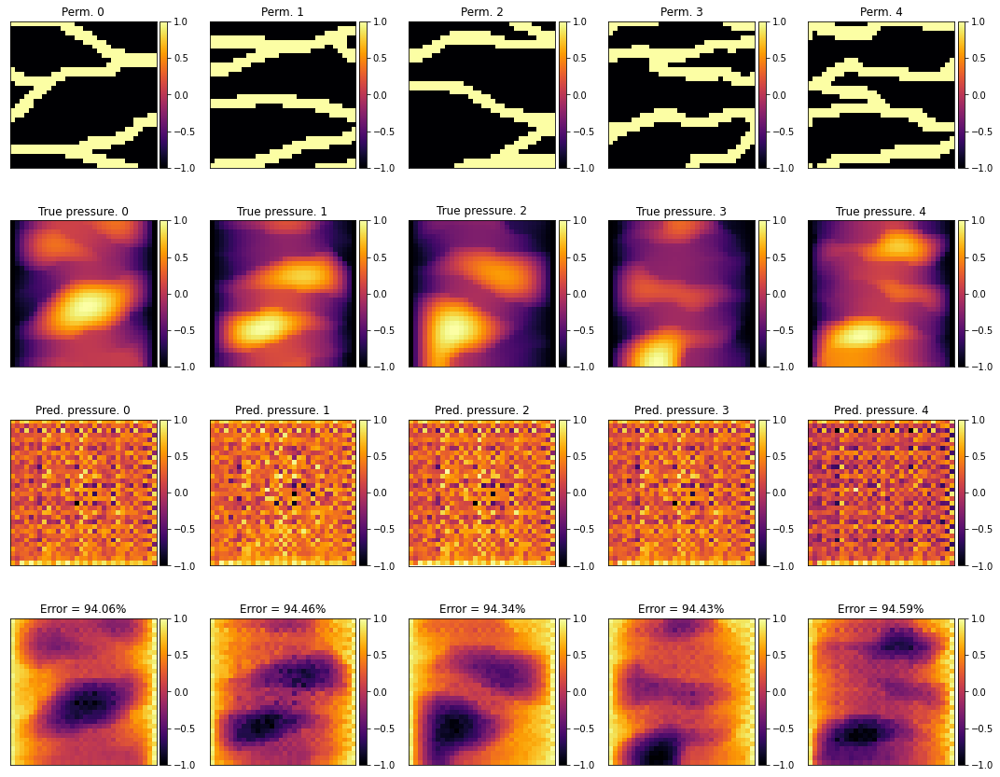

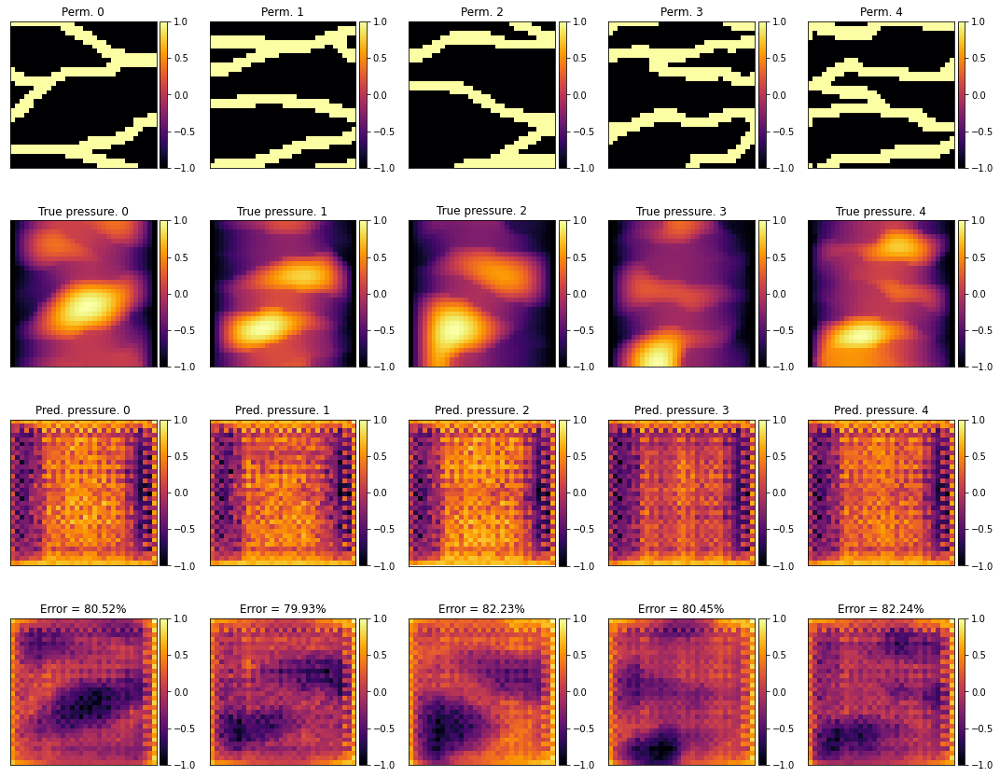

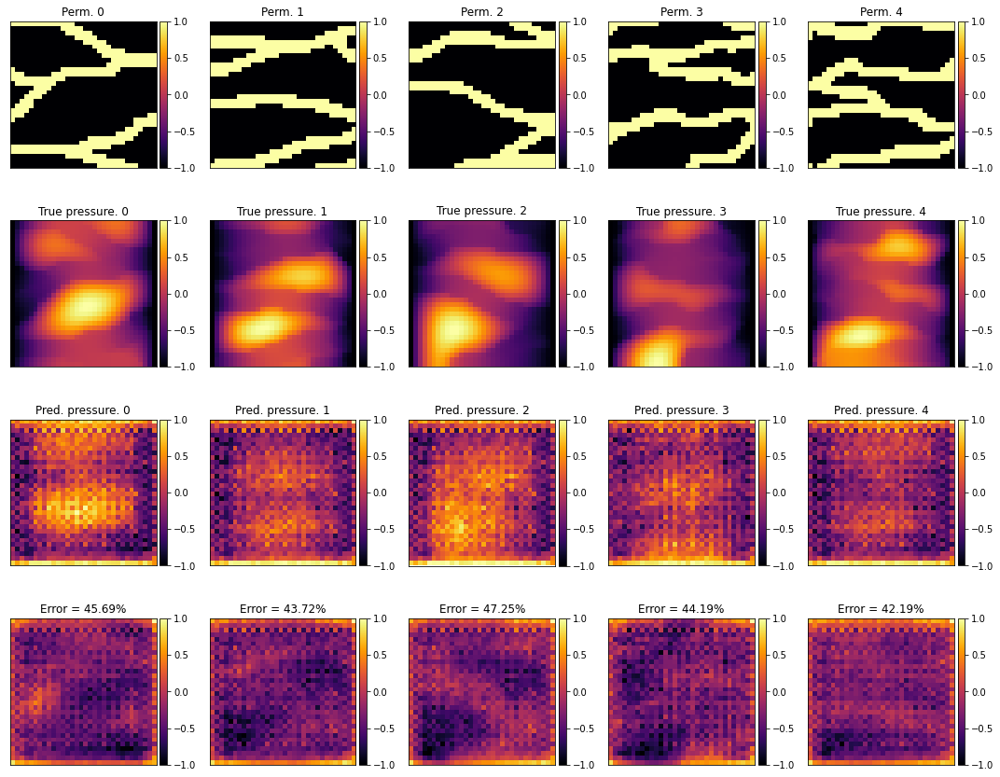

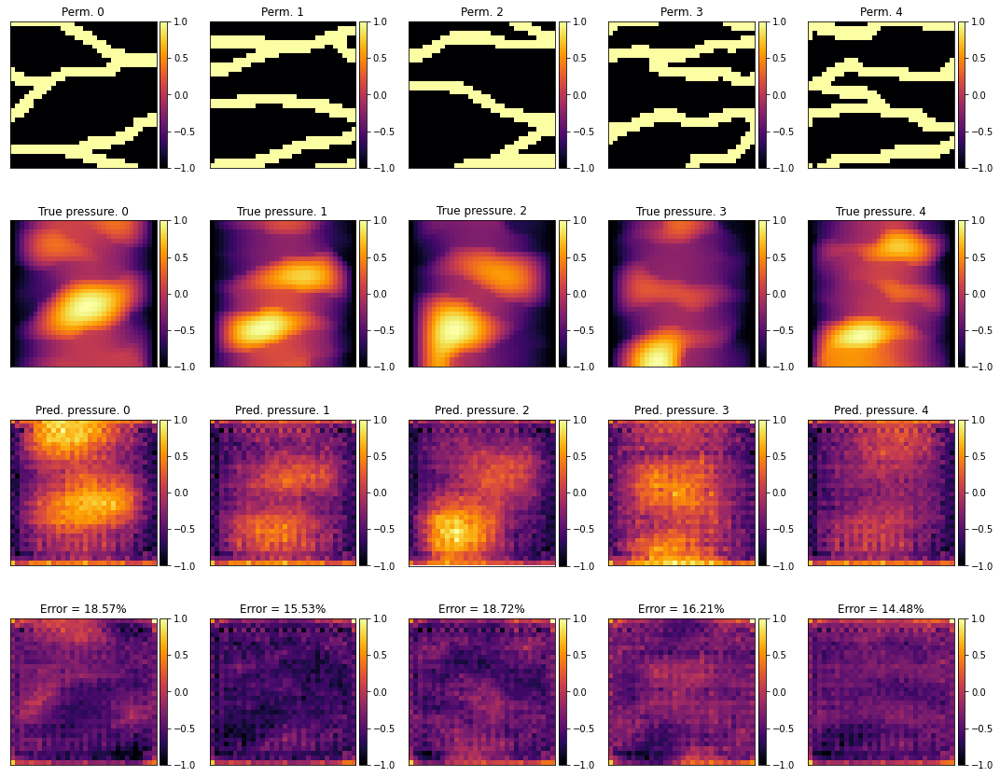

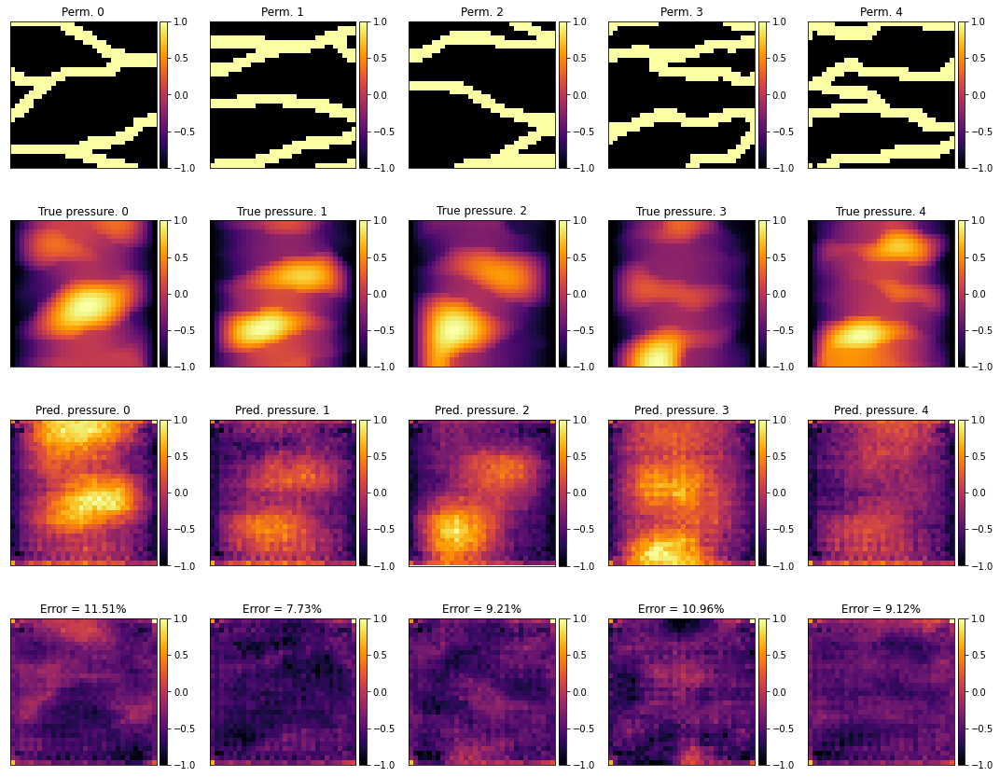

...

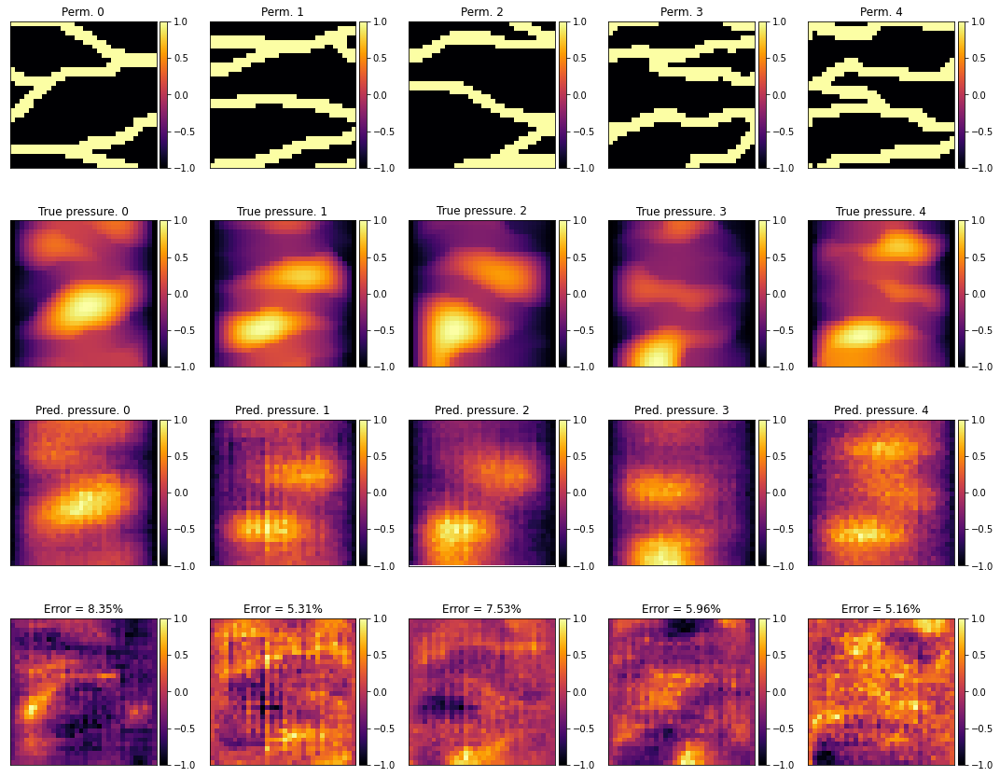

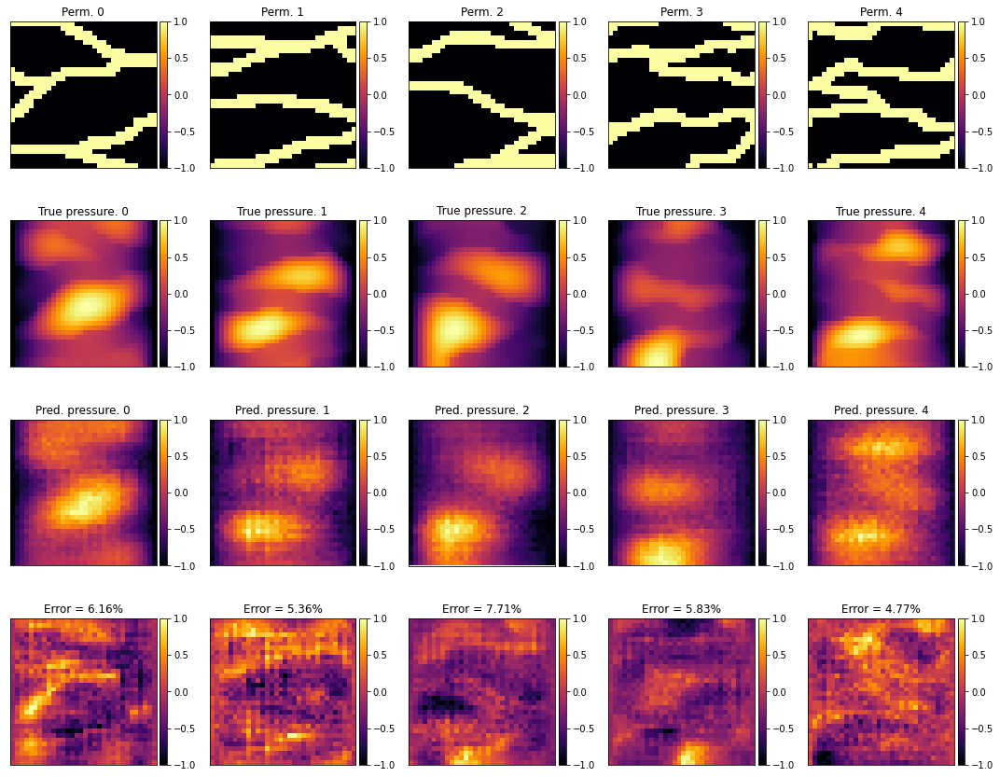

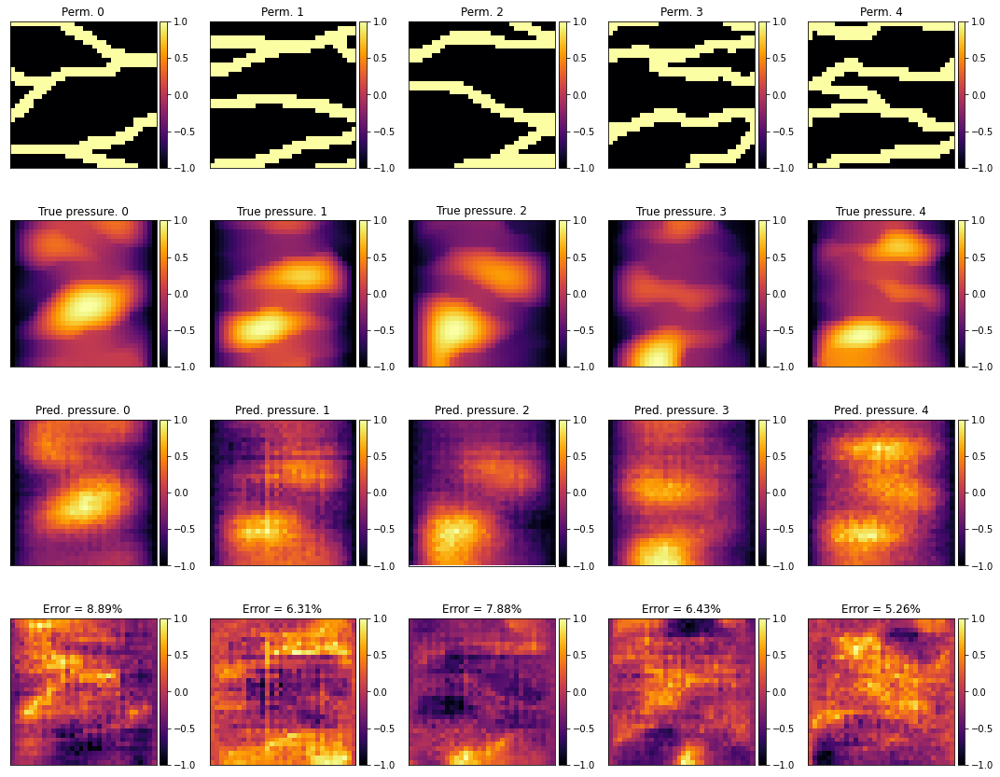

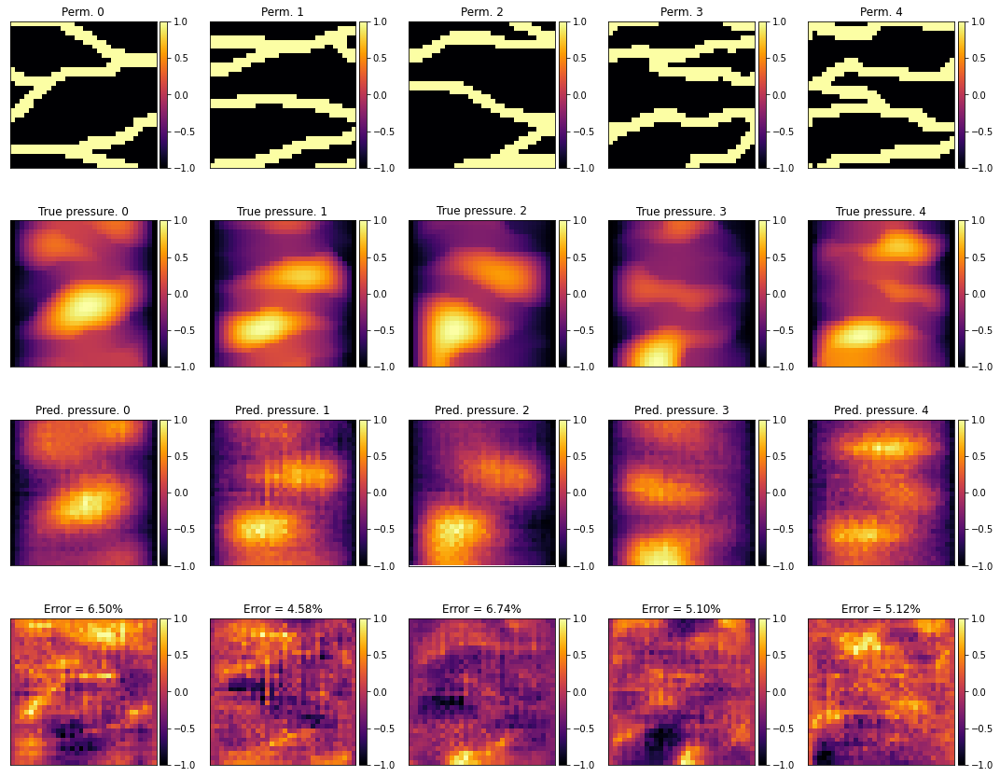

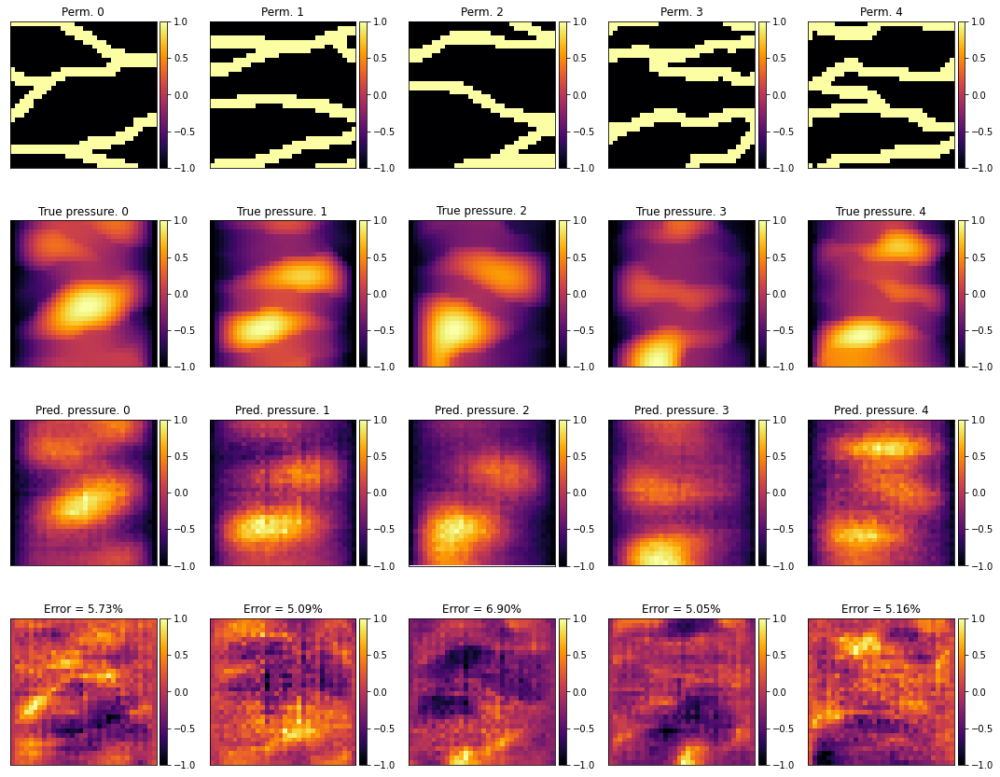

In [8]:
# Import libraries
import os
import pprint
import numpy as np
import wandb
wandb.login(key ="31c79a634ea1d5fdcee1295f24391849b23ae242")       # Use your unique API key here! You may find it in your wandb account settings.
import torch
import torch.nn as nn
from torchsummary import summary
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

# from utils import *
# from models import FCN

# Ensure reproducibility
torch.backends.cudnn.deterministic = True
seed_no = 108
np.random.seed(hash("improves reproducibility") % seed_no)
torch.manual_seed(hash("by removing stochasticity") % seed_no)
torch.cuda.manual_seed_all(hash("so runs are repeatable") % seed_no)
# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)



# ==============================================================================
# Hyperparameters and Data loader
# ==============================================================================
# Loading the data
n_data = 4608
m_field = np.load("permeability.npy")[:n_data, :, :]
u_field = np.load("pressure.npy")[:n_data, :, :]

# Normalize the data between -1 and 1
m_field = ((m_field - m_field.min())/(m_field.max()-m_field.min()))*2 - 1.
u_field = ((u_field - u_field.min())/(u_field.max()-u_field.min()))*2 - 1.

# Hyperparameters
batch_size = 1024
#lr = 0.01
num_epochs = 150
log_freq = int(0.1 * num_epochs)
n_train = int(0.8 * m_field.shape[0])

# Data loader
train_m_field = torch.from_numpy(m_field[:n_train, :, :]).float().to(device)
train_u_field = torch.from_numpy(u_field[:n_train, :, :]).float().to(device)
val_m_field = torch.from_numpy(m_field[n_train:, :, :]).float().to(device)
val_u_field = torch.from_numpy(u_field[n_train:, :, :]).float().to(device)
train_dataset = torch.utils.data.TensorDataset(train_m_field, train_u_field)
test_dataset = torch.utils.data.TensorDataset(val_m_field, val_u_field)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset,
                                             batch_size=batch_size,
                                                shuffle=True)

#wandb hyperparameter dictionary
sweep_configuration = {
    "method": "grid",
    "name": "grid_search",
    "metric": {"goal": "minimize", "name": "val_loss"},
    "parameters": 
    {
        "dim": {"values": [16, 32,64]},
        "h_dim": {"values": [64, 128, 256]},
        "reg_param": {"values": [0.0]},
        "lr": {"values": [0.001]}
     }
}
pprint.pprint(sweep_configuration)
project_name = "cme216_hw6"
group_name = "hw6"
sweep_id = wandb.sweep(sweep_configuration, project=project_name)



import time
t1 = time.time()
# ==============================================================================
# Training
# ==============================================================================
# Train the model
total_step = len(train_loader)
loss_list = []
hist_data = []
def train(config=None):
    # Initialize the new wandb run
    wandb.init(config=config, project=project_name, group=group_name) 
    config = wandb.config

    model = CAE(config.dim, config.h_dim).to(device)
    print("dim: {} h_dim: {} ".format(config.dim, config.h_dim))
    
    
    #summary(model, (1, 32, 32))
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=config.lr, weight_decay=config.reg_param)
    for epoch in range(num_epochs):
        for i, (train_x, train_y) in enumerate(train_loader):
            # Run the forward pass
            model.train()
            output = model(train_x.unsqueeze(1))
            loss = criterion(output, train_y.unsqueeze(1))
            loss_list.append(loss.item())
            # Backprop and perform Adam optimisation
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        if (epoch+1) % log_freq == 0:
            # Calculate the validation loss
            model.eval()
            with torch.no_grad():
                val_u_field_pred = model(val_m_field.unsqueeze(1))                    
                val_loss = criterion(val_u_field_pred, val_u_field.unsqueeze(1))
            
            plot_perm_and_temp(val_m_field.detach().cpu().numpy().squeeze(), 
                                val_u_field.detach().cpu().numpy().squeeze(), 
                                val_u_field_pred.detach().cpu().numpy().squeeze(), epoch)            
            
            diff_ = (val_u_field_pred - val_u_field.unsqueeze(1)).detach().cpu().numpy().squeeze()
            diff_vec = np.reshape(diff_, (diff_.shape[0], -1))
            val_l2_pt_error = np.mean(np.linalg.norm(diff_vec, axis=1) / np.linalg.norm(np.reshape(val_u_field.detach().cpu().numpy(), (val_u_field.shape[0], -1)), axis=1), axis=0) * 100

            #plot histogram
            relative_error = np.linalg.norm(diff_vec, axis=1) / np.linalg.norm(np.reshape(val_u_field.detach().cpu().numpy(), (val_u_field.shape[0], -1)), axis=1)*100
            relative_error =np.array(relative_error)      
            hist(relative_error,epoch)         
            
            wandb.log({"val_loss": val_loss.item(), "train_loss": loss.item(), "val_rel_error_pt": val_l2_pt_error, "epoch": epoch})

            print (f"Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{total_step}], \
                    Training Loss: {loss.item():.4f}, Validation Loss: {val_loss.item():.4f}, \
                    Val. error (in %) = {val_l2_pt_error:.2f}%")
            

    # Save the model checkpoint (optional)
    save_path = os.path.join(wandb.run.dir, "model.ckpt")
    torch.save(model.state_dict(), save_path)

wandb.agent(sweep_id, train)
t2 = time.time()
print(f"Total time taken: {t2-t1}")
wandb.finish()



